# Image Thresholding in OpenCV

In the code snippet you provided, it appears to be using the OpenCV library in Python to perform thresholding on an image (img). The cv.threshold function is commonly used for image thresholding, and it takes several parameters. Here's an explanation of the return values:

ret: This variable stores the threshold value that was used during the thresholding operation. The thresholding process involves comparing pixel values in the input image (img) with a specified threshold value (127 in this case). Pixels with values greater than the threshold are set to a maximum value (255), and pixels with values less than or equal to the threshold are set to zero. The ret variable allows you to retrieve the threshold value that was automatically determined by the function if you specify the cv.THRESH_OTSU flag, for example.

thresh1: This variable holds the thresholded image as a result of applying the thresholding operation. In this specific case, it uses the binary thresholding method (cv.THRESH_BINARY). In binary thresholding, pixel values that are greater than the specified threshold (127) are set to the maximum value (255), and those less than or equal to the threshold are set to zero. As a result, thresh1 contains a binary image where pixels are either completely black (0) or completely white (255) based on the applied threshold.


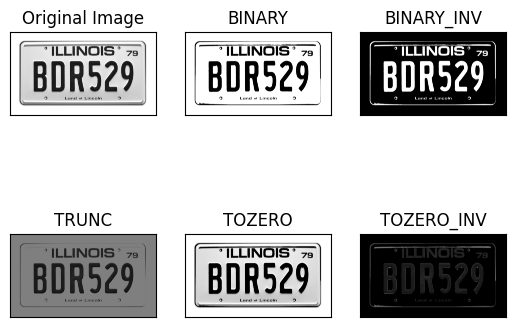

In [ ]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
img = cv.imread('./images/liscence.jpg', cv.IMREAD_GRAYSCALE)
assert img is not None, "file could not be read, check with os.path.exists()"
ret,thresh1 = cv.threshold(img,127,255,cv.THRESH_BINARY)
ret,thresh2 = cv.threshold(img,127,255,cv.THRESH_BINARY_INV)
ret,thresh3 = cv.threshold(img,127,255,cv.THRESH_TRUNC)
ret,thresh4 = cv.threshold(img,127,255,cv.THRESH_TOZERO)
ret,thresh5 = cv.threshold(img,127,255,cv.THRESH_TOZERO_INV)
titles = ['Original Image','BINARY','BINARY_INV','TRUNC','TOZERO','TOZERO_INV']
images = [img, thresh1, thresh2, thresh3, thresh4, thresh5]
for i in range(6):
    plt.subplot(2,3,i+1),plt.imshow(images[i],'gray',vmin=0,vmax=255)
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])
plt.show()

#Connected Component Segmentation

The cv2.connectedComponents function in OpenCV is used for connected component analysis (CCA) on a binary image. Here's an explanation of the function's return values and parameters:

Parameters:
binary_image: The input binary image on which connected component analysis will be performed. This should be a binary image where pixels are either 0 (background) or 255 (foreground).
Return Values:
num_labels: The number of connected components found in the input binary image, excluding the background. Each connected component is assigned a unique label ranging from 1 to num_labels. The background is labeled as 0.

labels: An image of the same size as the input binary image, where each pixel is labeled with the ID of the connected component to which it belongs. Pixels corresponding to the background are labeled as 0. The labeled image is useful for further analysis or visualization of the connected components.

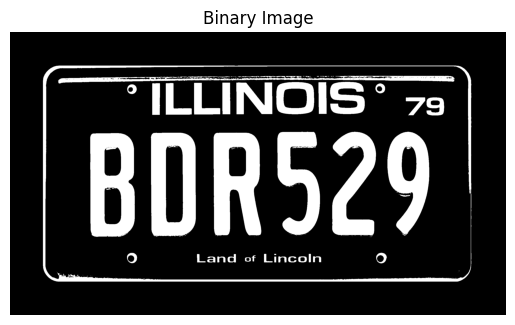

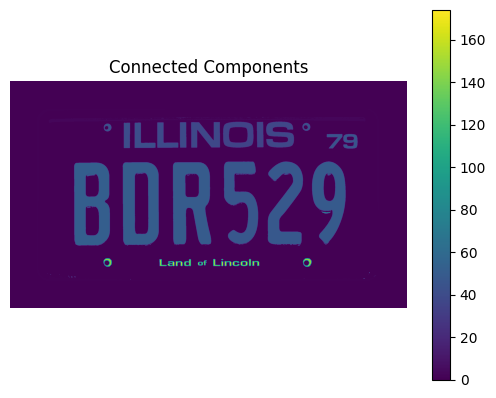

Number of Connected Components: 174


In [ ]:
# Perform connected component analysis
num_labels, labels = cv.connectedComponents(thresh2,connectivity=8)

# Display the original binary image
plt.imshow(thresh2, cmap='gray')
plt.title('Binary Image')
plt.axis('off')  # Turn off axis labels
plt.show()
cv.waitKey(0)
cv.destroyAllWindows()

# Display the connected components labeled image using Matplotlib
plt.imshow(labels, cmap='viridis')  # You can choose a colormap that suits your preference
plt.title('Connected Components')
plt.colorbar()  # Display colorbar for the labels
plt.axis('off')  # Turn off axis labels
plt.show()
cv.waitKey(0)
cv.destroyAllWindows()

# Print the number of connected components (excluding the background)
print(f'Number of Connected Components: {num_labels - 1}')


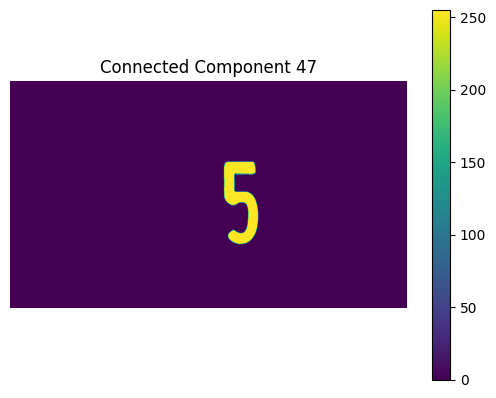

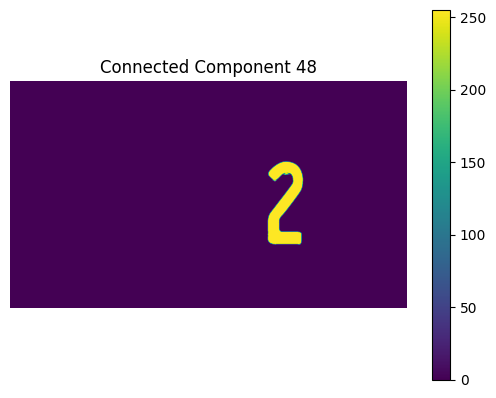

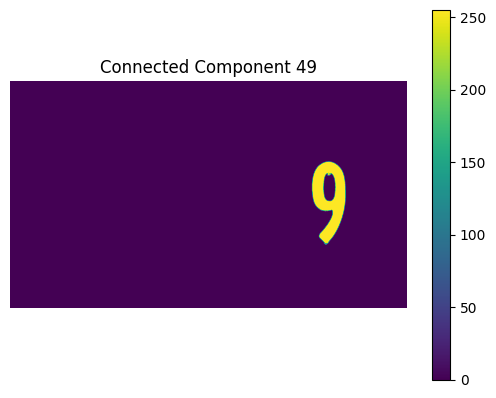

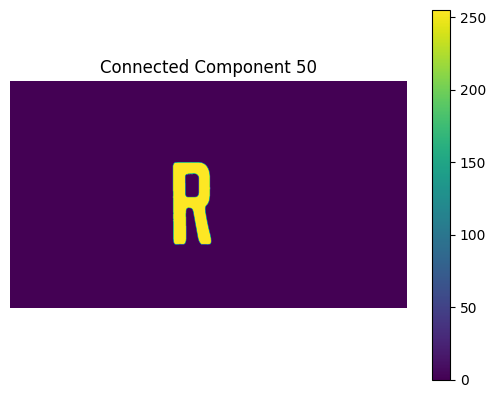

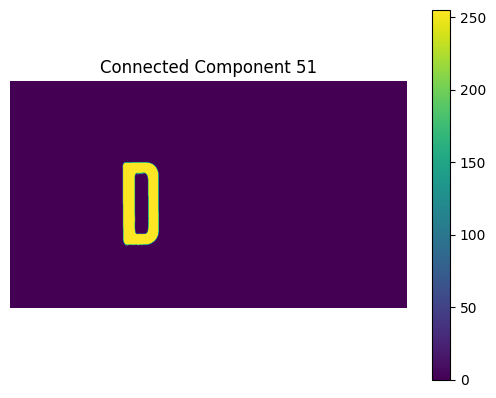

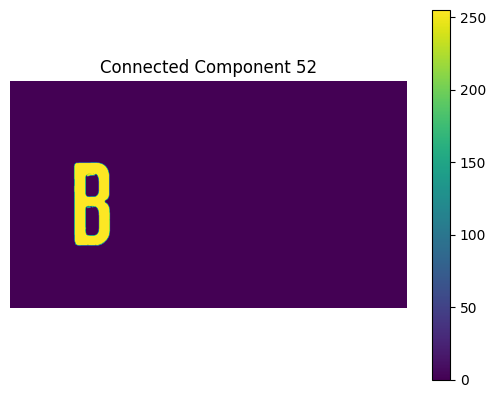

In [ ]:

# Iterate over each connected component
for label_id in range(1, num_labels):  # Start from 1 to exclude the background (label 0)
    if label_id >=47 and label_id <=52:
        # Create a mask for the current connected component
        component_mask = np.uint8(labels == label_id) * 255

        # Extract the connected component from the original image using the mask
        connected_component = cv.bitwise_and(thresh2, thresh2, mask=component_mask)

        # Display or process the connected component as needed
        #cv.imshow(f'Connected Component {label_id}', connected_component)
        plt.imshow(connected_component, cmap='viridis')  # You can choose a colormap that suits your preference
        plt.title(f'Connected Component {label_id}')
        plt.colorbar()  # Display colorbar for the labels
        plt.axis('off')  # Turn off axis labels
        plt.show()
        cv.waitKey(0)

# Close all OpenCV windows
cv.destroyAllWindows()


#Image processing in Spatial Domain

##1. Image Negative


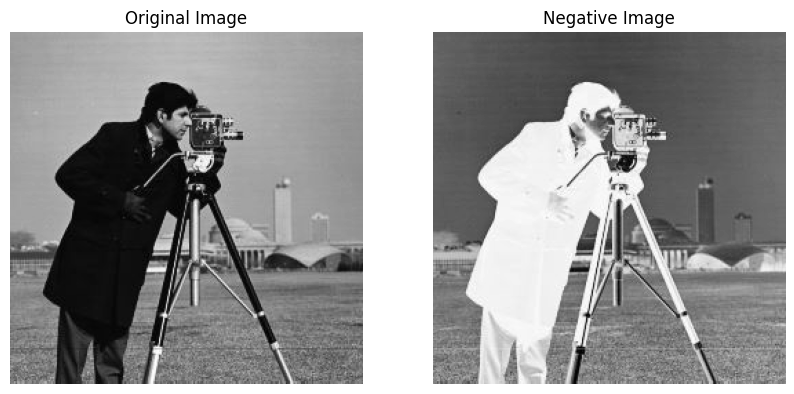

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

#Read the image using OpenCV
image_path = './images/cameraman.jpg'
original_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

#Create the negative of the image
negative_image = 255 - original_image

#Plot the original and negative images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(original_image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(negative_image, cmap='gray')
plt.title('Negative Image')
plt.axis('off')

plt.show()

##2. Image Addition

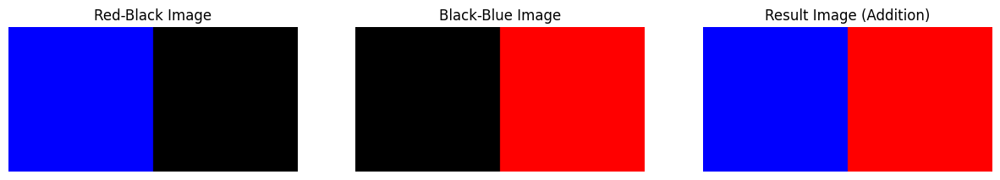

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Create a vertically half red and half black image
red_black_image = np.zeros((100, 200, 3), dtype=np.uint8)
red_black_image[:, :100, 2] = 255  # Set the red channel to 255 in the left half

# Create a black and blue image
black_blue_image = np.zeros((100, 200, 3), dtype=np.uint8)
black_blue_image[:, 100:, 0] = 255  # Set the blue channel to 255 in the right half

# Add the two images together

#result_image = cv2.add(red_black_image, black_blue_image)
result_image=red_black_image+black_blue_image

# Plot all three images
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(red_black_image)
plt.title('Red-Black Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(black_blue_image)
plt.title('Black-Blue Image')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(result_image)
plt.title('Result Image (Addition)')
plt.axis('off')

plt.show()

##3. Image Subtraction

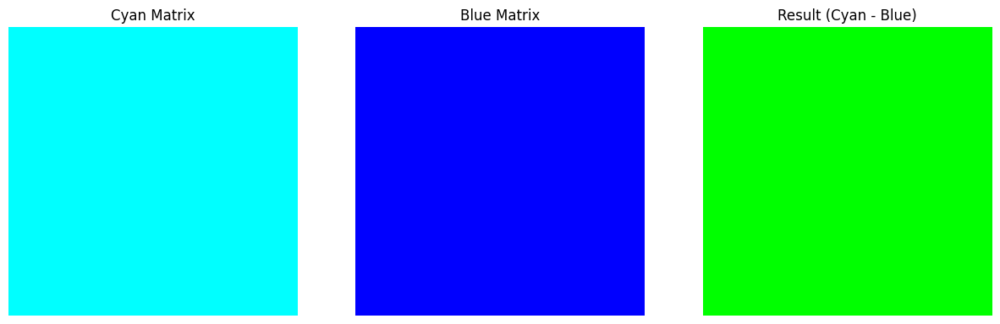

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Create a 600 x 400 matrix of cyan color
cyan_matrix = np.full((400, 400, 3), [0, 255, 255], dtype=np.uint8)

# Create a 600 x 400 matrix of blue color
blue_matrix = np.full((400, 400, 3), [0, 0, 255], dtype=np.uint8)

# Subtract the blue matrix from the cyan matrix
result_matrix = cyan_matrix - blue_matrix

# Plot all three matrices
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(cyan_matrix)
plt.title('Cyan Matrix')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(blue_matrix)
plt.title('Blue Matrix')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(result_matrix)
plt.title('Result (Cyan - Blue)')
plt.axis('off')

plt.show()

##4. Thresholding

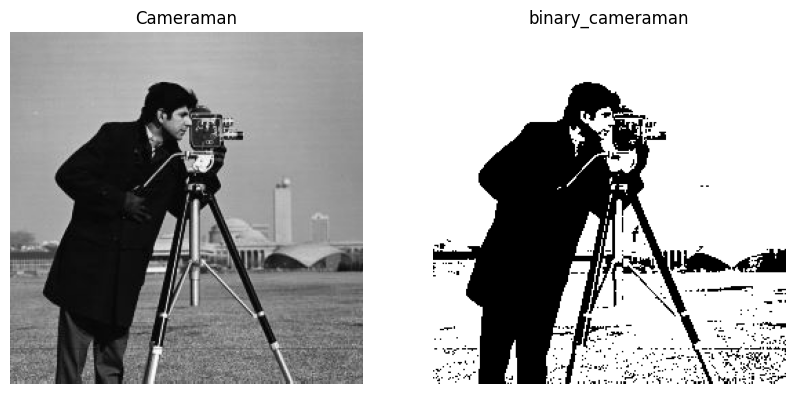

In [ ]:
image_path='./images/cameraman.jpg'
cameraman=cv2.imread(image_path)
ret,binary_cameraman = cv.threshold(cameraman,100,255,cv.THRESH_BINARY)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(cameraman)
plt.title('Cameraman')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(binary_cameraman)
plt.title('binary_cameraman')
plt.axis('off')

plt.show()


##5. Histogram

cv2.calcHist() calculates the histogram. The parameters are:
1. images: The source image.
2. channels: The channel for which we calculate the histogram. For grayscale images, it's [0].
3. mask: Optional mask. Use None for the entire image.
4. histSize: The number of bins (256 for pixel values ranging from 0 to 255).
5. ranges: The range of pixel values.

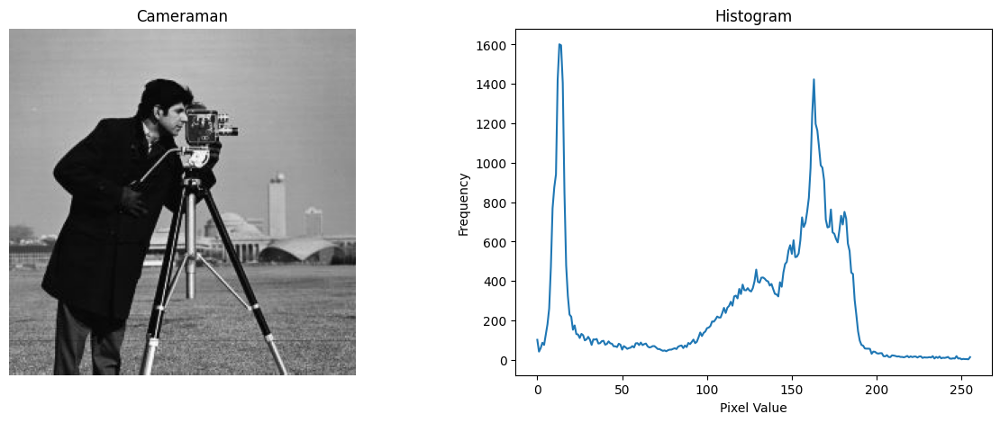

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Read the image in grayscale
image = cv2.imread('./images/cameraman.jpg')  # Replace with the actual path to your image

# Calculate the histogram
hist = cv2.calcHist([image], [0], None, [256], [0, 256])

plt.figure(figsize=(15, 5))

plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title('Cameraman')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.plot(hist)
plt.title('Histogram')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')

plt.show()

# Fourier Transform into Frequency Domain

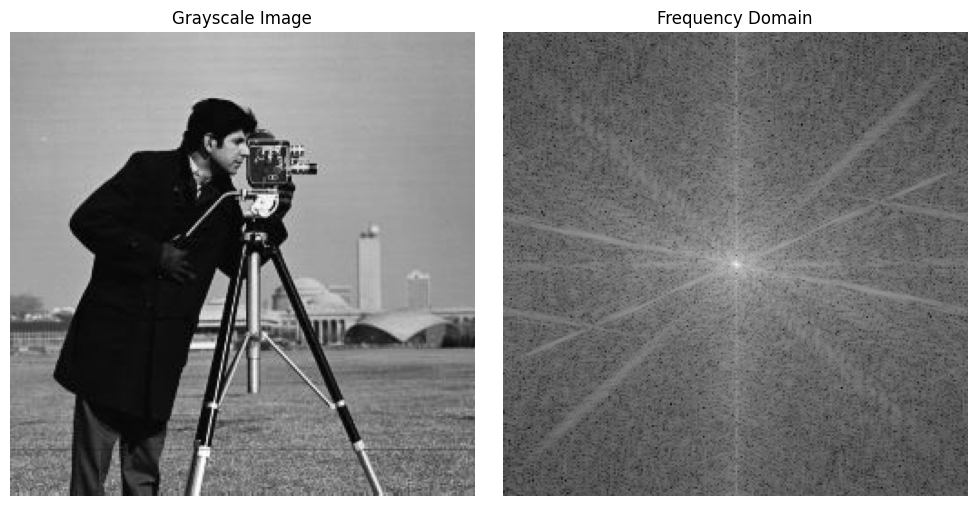

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the image in grayscale
image = cv2.imread('./images/cameraman.jpg', cv2.IMREAD_GRAYSCALE)  # Replace with the actual path to your image

# Perform 2D Fourier Transform
f_transform = np.fft.fft2(image)
f_transform_shifted = np.fft.fftshift(f_transform)

# Compute the magnitude spectrum
magnitude_spectrum = np.abs(f_transform_shifted)

# Plot the image and its frequency domain
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Grayscale Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(np.log(1 + magnitude_spectrum), cmap='gray')
plt.title('Frequency Domain')
plt.axis('off')

plt.tight_layout()
plt.show()

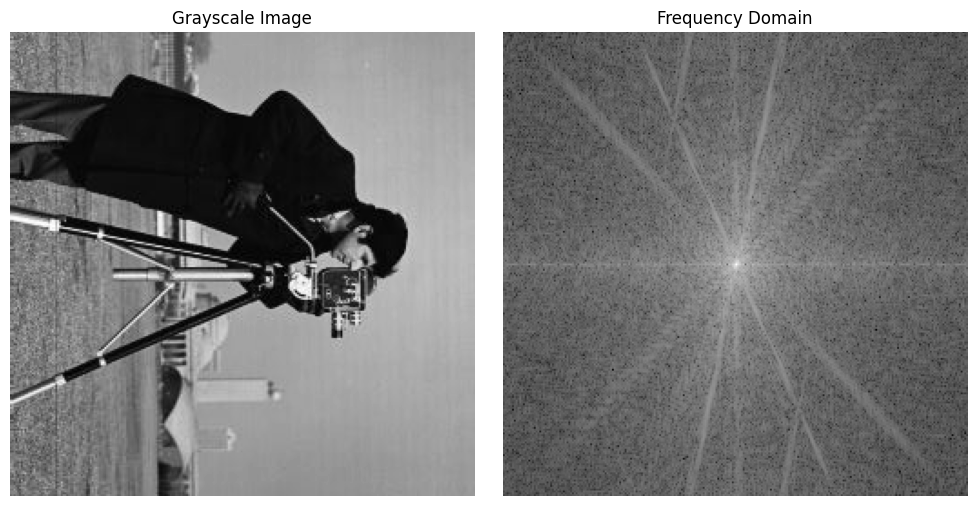

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the image in grayscale
image = cv2.imread('./images/cameraman.jpg', cv2.IMREAD_GRAYSCALE)  # Replace with the actual path to your image
image = cv2.rotate(image, cv2.ROTATE_90_CLOCKWISE)
# Perform 2D Fourier Transform
f_transform = np.fft.fft2(image)
f_transform_shifted = np.fft.fftshift(f_transform)

# Compute the magnitude spectrum
magnitude_spectrum = np.abs(f_transform_shifted)

# Plot the image and its frequency domain
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Grayscale Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(np.log(1 + magnitude_spectrum), cmap='gray')
plt.title('Frequency Domain')
plt.axis('off')

plt.tight_layout()
plt.show()

# Contrast Enhancement in Images

(533, 800, 3)


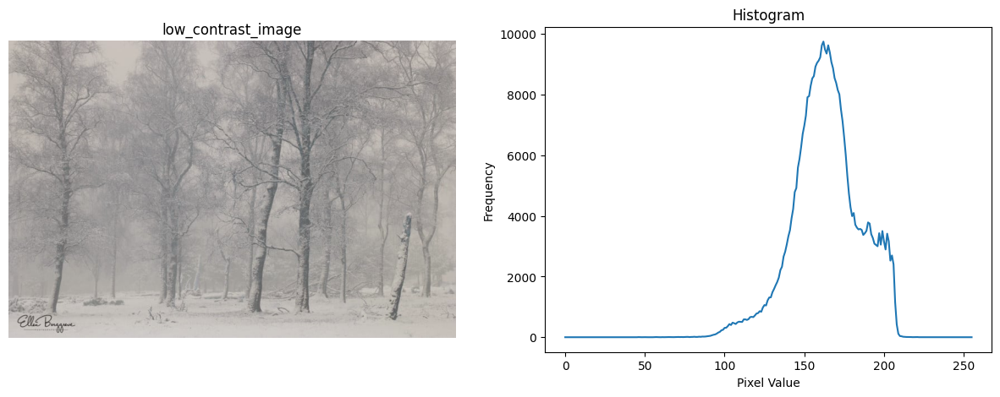

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow

low_contrast_image=cv2.imread('./images/forest.jpg')
print(low_contrast_image.shape)
hist = cv2.calcHist([low_contrast_image], [0], None, [256], [0, 256])

plt.figure(figsize=(15, 5))

plt.subplot(1, 2, 1)
plt.imshow(low_contrast_image)
plt.title('low_contrast_image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.plot(hist)
plt.title('Histogram')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')

plt.show()

#cv2_imshow(low_contrast_image)

##1. Multiplication By Constant

(533, 800, 3)


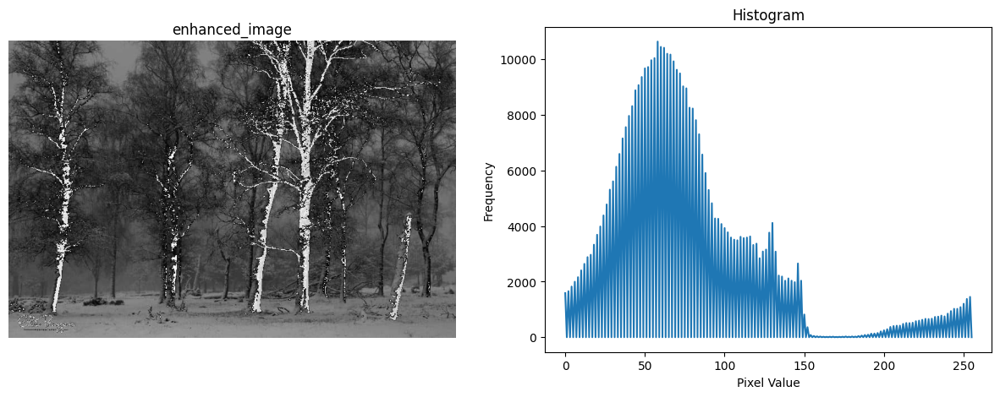

In [ ]:
from google.colab.patches import cv2_imshow
low_contrast_image=cv2.imread('./images/forest.jpg',cv2.IMREAD_GRAYSCALE)
enhanced_image=low_contrast_image*2
enhanced_image = cv2.cvtColor(enhanced_image, cv2.COLOR_GRAY2BGR)
print(enhanced_image.shape)
hist = cv2.calcHist([enhanced_image], [0], None, [256], [0, 256])

plt.figure(figsize=(15, 5))

plt.subplot(1, 2, 1)
plt.imshow(enhanced_image)
plt.title('enhanced_image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.plot(hist)
plt.title('Histogram')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')

plt.show()

##2. Normalisation/Gamma Correction

(533, 800, 3)


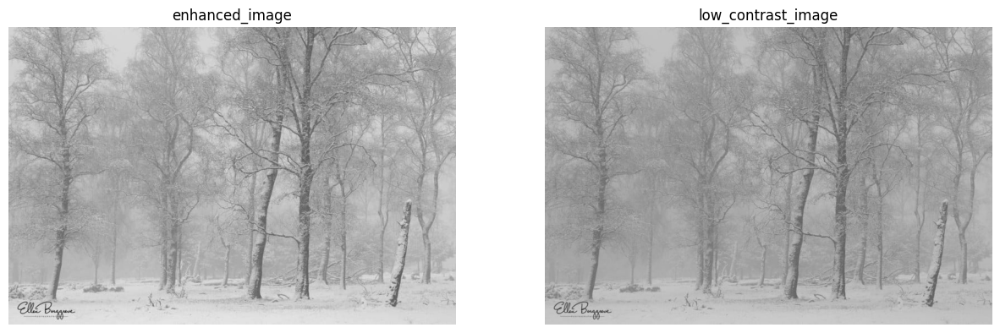

In [ ]:
low_contrast_image=cv2.imread('./images/forest.jpg',cv2.IMREAD_GRAYSCALE)

min_val, max_val, _, _ = cv2.minMaxLoc(low_contrast_image)

enhanced_image = np.clip((low_contrast_image - min_val) / (max_val - min_val) * 255, 0, 255).astype(np.uint8)

enhanced_image = cv2.cvtColor(enhanced_image, cv2.COLOR_GRAY2BGR)
print(enhanced_image.shape)
hist = cv2.calcHist([enhanced_image], [0], None, [256], [0, 256])

low_contrast_image = cv2.cvtColor(low_contrast_image, cv2.COLOR_GRAY2BGR)

plt.figure(figsize=(15, 5))

plt.subplot(1, 2, 1)
plt.imshow(enhanced_image)
plt.title('enhanced_image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(low_contrast_image)
plt.title('low_contrast_image')
plt.axis('off')

# plt.subplot(1, 2, 2)
# plt.plot(hist)
# plt.title('Histogram')
# plt.xlabel('Pixel Value')
# plt.ylabel('Frequency')

plt.show()

### With Noise (Salt and Pepper)

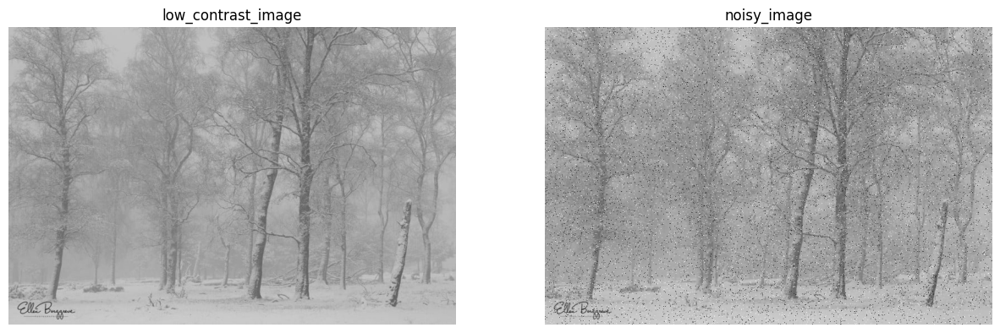

In [ ]:
from google.colab.patches import cv2_imshow

low_contrast_image = cv2.imread('./images/forest.jpg',cv2.IMREAD_GRAYSCALE)  # Replace 'your_image_path.jpg' with the actual path of your image

# Function to add salt-and-pepper noise
def add_salt_and_pepper_noise(image, salt_prob, pepper_prob):
    noisy_image = np.copy(image)

    # Salt noise
    salt_mask = np.random.random(image.shape[:2])
    noisy_image[salt_mask < salt_prob] = 255

    # Pepper noise
    pepper_mask = np.random.random(image.shape[:2])
    noisy_image[pepper_mask < pepper_prob] = 0

    return noisy_image

# Add salt-and-pepper noise (adjust probabilities as needed)
salt_prob = 0.02  # Probability of adding salt noise to each pixel
pepper_prob = 0.02  # Probability of adding pepper noise to each pixel
noisy_image = add_salt_and_pepper_noise(low_contrast_image, salt_prob, pepper_prob)

low_contrast_image = cv2.cvtColor(low_contrast_image, cv2.COLOR_GRAY2BGR)
noisy_image = cv2.cvtColor(noisy_image, cv2.COLOR_GRAY2BGR)

# Display the images (original and noisy)
plt.figure(figsize=(15, 5))

plt.subplot(1, 2, 1)
plt.imshow(low_contrast_image)
plt.title('low_contrast_image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(noisy_image)
plt.title('noisy_image')
plt.axis('off')

# plt.subplot(1, 2, 2)
# plt.plot(hist)
# plt.title('Histogram')
# plt.xlabel('Pixel Value')
# plt.ylabel('Frequency')

plt.show()



0.0 255.0
(533, 800, 3)


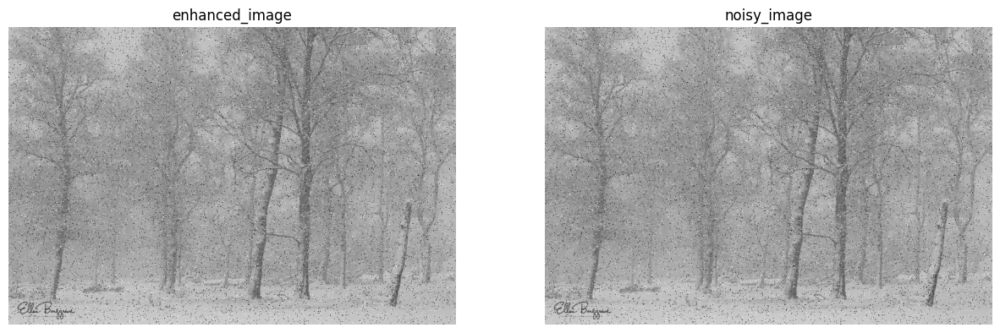

In [ ]:
noisy_image = cv2.cvtColor(noisy_image, cv2.COLOR_BGR2GRAY)
min_val, max_val, _, _ = cv2.minMaxLoc(noisy_image)
print(min_val,max_val)

enhanced_image = np.clip((noisy_image - min_val) / (max_val - min_val) * 255, 0, 255).astype(np.uint8)

enhanced_image = cv2.cvtColor(enhanced_image, cv2.COLOR_GRAY2BGR)
print(enhanced_image.shape)
hist = cv2.calcHist([enhanced_image], [0], None, [256], [0, 256])

#noisy_image = cv2.cvtColor(noisy_image, cv2.COLOR_GRAY2BGR)

plt.figure(figsize=(15, 5))

plt.subplot(1, 2, 1)
plt.imshow(enhanced_image)
plt.title('enhanced_image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(noisy_image,cmap='gray')
plt.title('noisy_image')
plt.axis('off')

# plt.subplot(1, 2, 2)
# plt.plot(hist)
# plt.title('Histogram')
# plt.xlabel('Pixel Value')
# plt.ylabel('Frequency')

plt.show()

##3. Histogram Equalisation

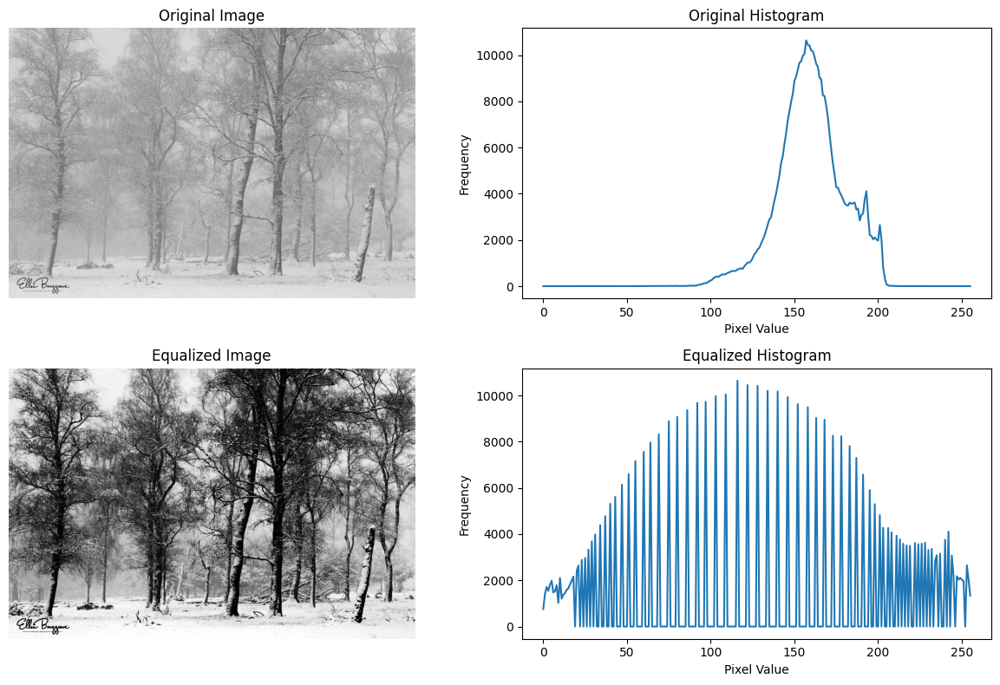

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Load the image
image = cv2.imread('./images/forest.jpg', cv2.IMREAD_GRAYSCALE)  # Replace 'your_image_path.jpg' with the actual path of your image

# Perform histogram equalization
equalized_image = cv2.equalizeHist(image)

# Compute histograms
hist_original = cv2.calcHist([image], [0], None, [256], [0, 256])
hist_equalized = cv2.calcHist([equalized_image], [0], None, [256], [0, 256])

# Plotting
plt.figure(figsize=(12, 8))

# Original Image
plt.subplot(2, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Original Histogram
plt.subplot(2, 2, 2)
plt.plot(hist_original)
plt.title('Original Histogram')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')

# Equalized Image
plt.subplot(2, 2, 3)
plt.imshow(equalized_image, cmap='gray')
plt.title('Equalized Image')
plt.axis('off')

# Equalized Histogram
plt.subplot(2, 2, 4)
plt.plot(hist_equalized)
plt.title('Equalized Histogram')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

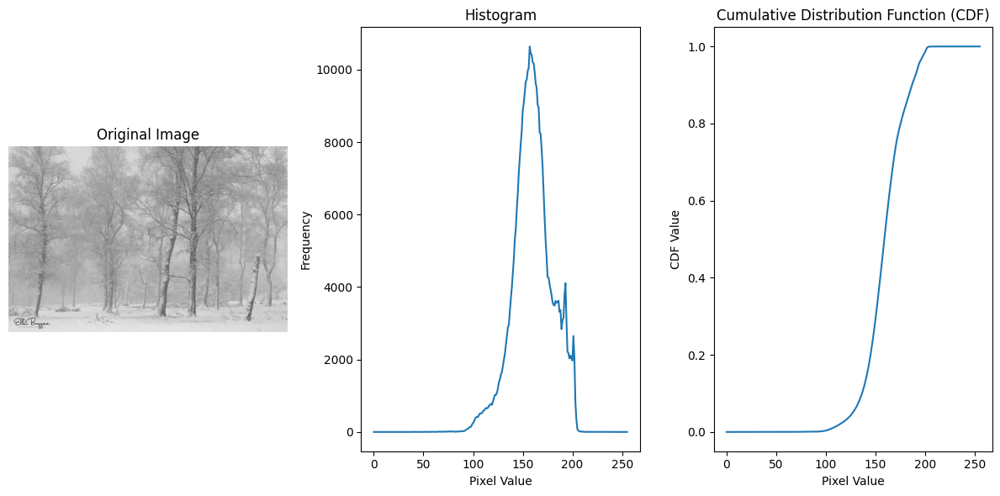

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Load the image
image = cv2.imread('./images/forest.jpg', cv2.IMREAD_GRAYSCALE)  # Replace 'your_image_path.jpg' with the actual path of your image

# Compute histogram and CDF
hist, bins = np.histogram(image.flatten(), 256, [0, 256])
cdf = hist.cumsum()

# Normalize CDF to the range [0, 1]
cdf_normalized = cdf / cdf.max()

# Plotting
plt.figure(figsize=(12, 6))

# Image
plt.subplot(1, 3, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Histogram
plt.subplot(1, 3, 2)
plt.plot(hist)
plt.title('Histogram')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')

# CDF
plt.subplot(1, 3, 3)
plt.plot(cdf_normalized)
plt.title('Cumulative Distribution Function (CDF)')
plt.xlabel('Pixel Value')
plt.ylabel('CDF Value')

plt.tight_layout()
plt.show()


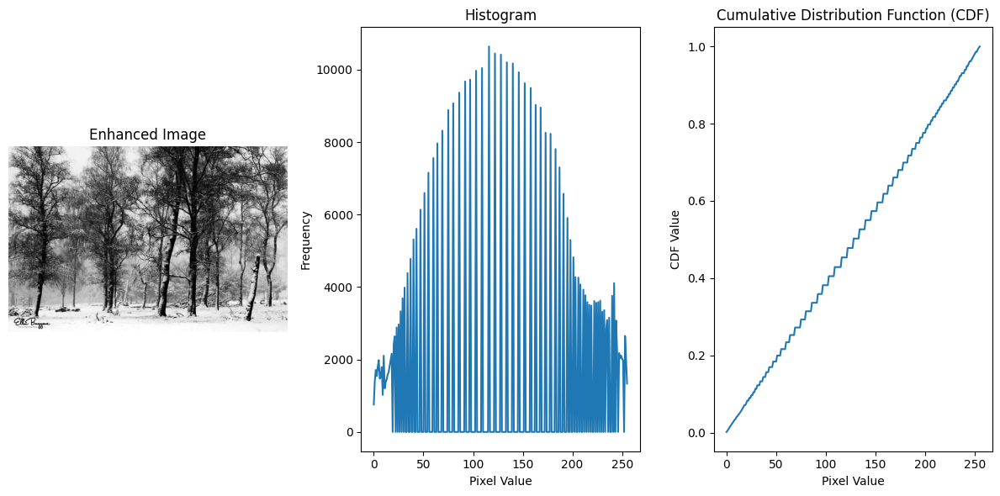

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Compute histogram and CDF
hist, bins = np.histogram(equalized_image.flatten(), 256, [0, 256])
cdf = hist.cumsum()

# Normalize CDF to the range [0, 1]
cdf_normalized = cdf / cdf.max()

# Plotting
plt.figure(figsize=(12, 6))

# Image
plt.subplot(1, 3, 1)
plt.imshow(equalized_image, cmap='gray')
plt.title('Enhanced Image')
plt.axis('off')

# Histogram
plt.subplot(1, 3, 2)
plt.plot(hist)
plt.title('Histogram')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')

# CDF
plt.subplot(1, 3, 3)
plt.plot(cdf_normalized)
plt.title('Cumulative Distribution Function (CDF)')
plt.xlabel('Pixel Value')
plt.ylabel('CDF Value')

plt.tight_layout()
plt.show()


##Adaptive Histogram Equalisation

(207, 197)


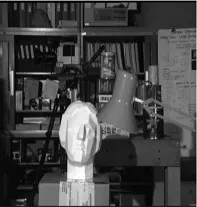

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

image_path='./images/low_contrast_image.png'
image=cv2.imread(image_path,cv2.IMREAD_GRAYSCALE)

print(image.shape)
cv2_imshow(image)

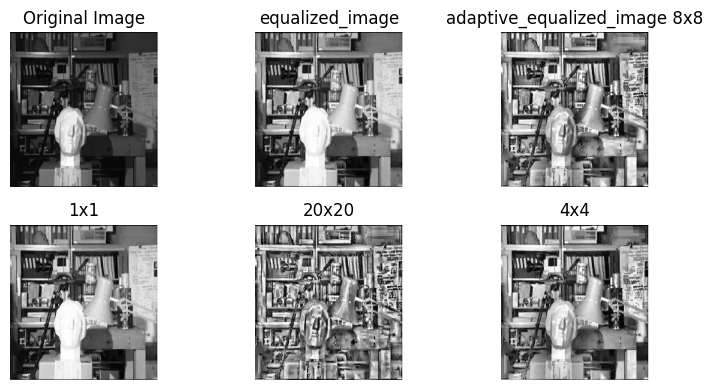

In [ ]:
equalized_image = cv2.equalizeHist(image)

# Create an adaptive histogram equalization object
clahe = cv2.createCLAHE(tileGridSize=(8,8))

# Apply adaptive histogram equalization to the image
adaptive_equalized_image = clahe.apply(image)

# Display the original and equalized images side by side

plt.figure(figsize=(8, 4))

# Image
plt.subplot(2, 3, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Equalised image
plt.subplot(2, 3, 2)
plt.imshow(equalized_image, cmap='gray')
plt.title('equalized_image')
plt.axis('off')

# Adaptive Equalised image (8,8)
plt.subplot(2, 3, 3)
plt.imshow(adaptive_equalized_image, cmap='gray')
plt.title('adaptive_equalized_image 8x8')
plt.axis('off')

# Adaptive Equalised image (1,1)
clahe = cv2.createCLAHE(tileGridSize=(1,1))
adaptive_equalized_image = clahe.apply(image)
plt.subplot(2, 3, 4)
plt.imshow(adaptive_equalized_image, cmap='gray')
plt.title('1x1')
plt.axis('off')

# Adaptive Equalised image (20,20)
clahe = cv2.createCLAHE(tileGridSize=(20,20))
adaptive_equalized_image = clahe.apply(image)
plt.subplot(2, 3, 5)
plt.imshow(adaptive_equalized_image, cmap='gray')
plt.title('20x20')
plt.axis('off')

# Adaptive Equalised image (4,4)
clahe = cv2.createCLAHE(tileGridSize=(4,4))
adaptive_equalized_image = clahe.apply(image)
plt.subplot(2, 3, 6)
plt.imshow(adaptive_equalized_image, cmap='gray')
plt.title('4x4')
plt.axis('off')

plt.tight_layout()
plt.show()

##CLAHE (Contrast Limited Adaptive Histogram Equalisation)

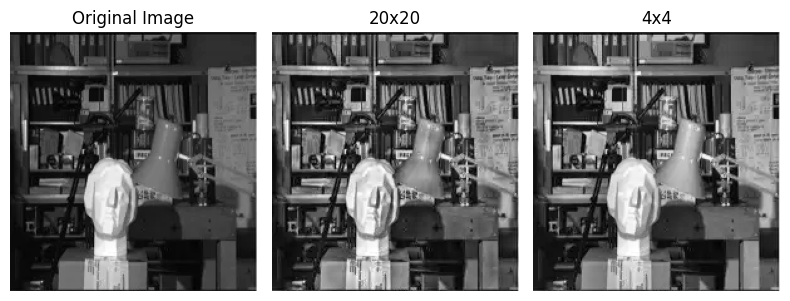

In [ ]:
# Display the original and equalized images side by side

plt.figure(figsize=(8, 4))

# Image
plt.subplot(1, 3, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Adaptive Equalised image (20,20)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(20,20))
adaptive_equalized_image = clahe.apply(image)
plt.subplot(1, 3, 2)
plt.imshow(adaptive_equalized_image, cmap='gray')
plt.title('20x20')
plt.axis('off')

# Adaptive Equalised image (4,4)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(4,4))
adaptive_equalized_image = clahe.apply(image)
plt.subplot(1, 3, 3)
plt.imshow(adaptive_equalized_image, cmap='gray')
plt.title('4x4')
plt.axis('off')

plt.tight_layout()
plt.show()

##Contrast Enhancement in Colour Images

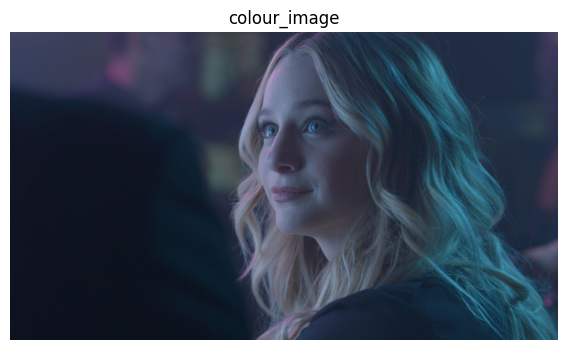

In [ ]:
import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

colour_image=cv2.imread('./images/colour_image.jpg')
colour_image = cv2.cvtColor(colour_image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(8, 4))

# Image
plt.subplot(1, 1, 1)
plt.imshow(colour_image)
plt.title('colour_image')
plt.axis('off')

plt.show()

###1. RGB channels enhancement

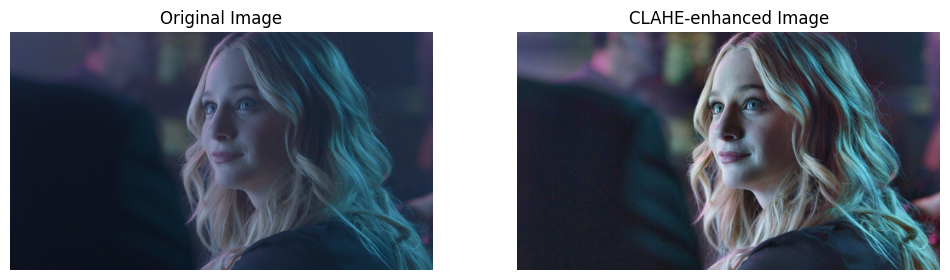

In [ ]:
# Load the color image
colour_image = cv2.imread('./images/colour_image.jpg')

# Split the image into its RGB channels
b, g, r = cv2.split(colour_image)

# Apply CLAHE to each channel separately
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
clahe_b = clahe.apply(b)
clahe_g = clahe.apply(g)
clahe_r = clahe.apply(r)

# Merge the CLAHE-enhanced channels back together
clahe_image = cv2.merge([clahe_b, clahe_g, clahe_r])

# Display the original and CLAHE-enhanced images
plt.figure(figsize=(12, 6))

# Original Image
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(colour_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

# CLAHE-enhanced Image
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(clahe_image, cv2.COLOR_BGR2RGB))
plt.title('CLAHE-enhanced Image')
plt.axis('off')

plt.show()

###2. Convert to HSV

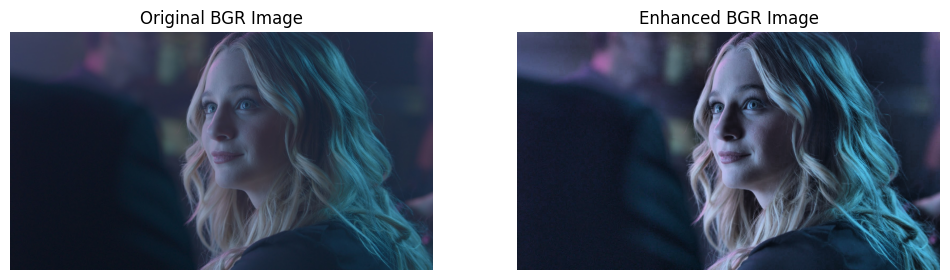

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load the BGR image
bgr_image = cv2.imread('./images/colour_image.jpg')

# Convert BGR to HSV
hsv_image = cv2.cvtColor(bgr_image, cv2.COLOR_BGR2HSV)

# Split the HSV image into its components
h, s, v = cv2.split(hsv_image)

# Apply CLAHE to the V (Value) channel
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
clahe_v = clahe.apply(v)

# Merge the enhanced V channel back with the original H and S channels
enhanced_hsv_image = cv2.merge([h, s, clahe_v])

# Convert HSV back to BGR
enhanced_bgr_image = cv2.cvtColor(enhanced_hsv_image, cv2.COLOR_HSV2BGR)

# Display the original and enhanced images
plt.figure(figsize=(12, 6))

# Original BGR Image
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(bgr_image, cv2.COLOR_BGR2RGB))
plt.title('Original BGR Image')
plt.axis('off')

# Enhanced BGR Image
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(enhanced_bgr_image, cv2.COLOR_BGR2RGB))
plt.title('Enhanced BGR Image')
plt.axis('off')

plt.show()

# Correlation in Images

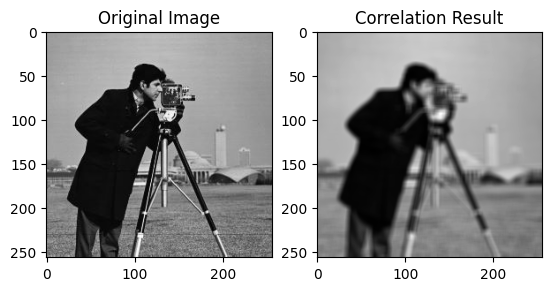

In [ ]:
cameraman=cv2.imread('./images/cameraman.jpg',cv2.IMREAD_GRAYSCALE)

import numpy as np

# Create a 7x7 kernel with pixel values of 1/49
kernel = np.ones((7, 7), dtype=np.float32) / 49


# Perform correlation using cv2.filter2D
result = cv2.filter2D(cameraman, -1, kernel)

# Plot the original image
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(cameraman, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

# Plot the result of correlation
plt.subplot(1, 2, 2)
plt.imshow(result, cmap='gray')
plt.title('Correlation Result')

plt.show()

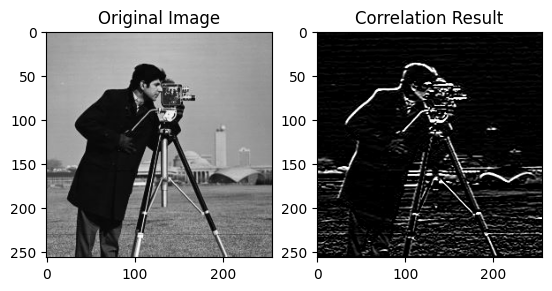

In [ ]:
cameraman=cv2.imread('./images/cameraman.jpg',cv2.IMREAD_GRAYSCALE)

import numpy as np

# Create horizontal line detection kernel
kernel = np.array([[1, 2, 1],
                   [0, 0, 0],
                   [-1, -2, -1]])

# Perform correlation using cv2.filter2D
result = cv2.filter2D(cameraman, -1, kernel)

# Plot the original image
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(cameraman, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

# Plot the result of correlation
plt.subplot(1, 2, 2)
plt.imshow(result, cmap='gray')
plt.title('Correlation Result')

plt.show()

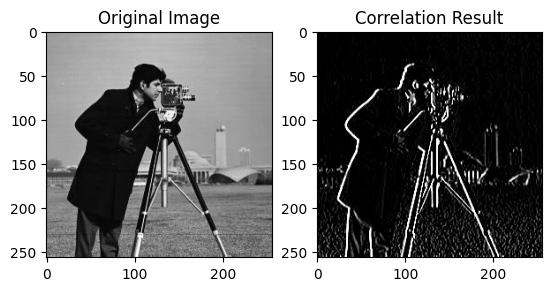

In [ ]:
cameraman=cv2.imread('./images/cameraman.jpg',cv2.IMREAD_GRAYSCALE)

import numpy as np

# Create vertical line detection kernel
kernel = np.array([[1, 0, -1],
                   [2, 0, -2],
                   [1, 0, -1]])

# Perform correlation using cv2.filter2D
result = cv2.filter2D(cameraman, -1, kernel)

# Plot the original image
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(cameraman, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

# Plot the result of correlation
plt.subplot(1, 2, 2)
plt.imshow(result, cmap='gray')
plt.title('Correlation Result')

plt.show()

In [ ]:
#Separable Kernels

import numpy as np
from scipy.signal import convolve2d

# Define your matrices A and B
A = np.array([[0, 0.33, 0],
              [0, 0.33, 0],
              [0, 0.33, 0]])

B = np.array([[0, 0, 0],
              [0.33, 0.33, 0.33],
              [0, 0, 0]])

# Calculate the correlation matrix
result = convolve2d(A, B, mode='same', boundary='fill', fillvalue=0)

# Display the result
print("Correlation Matrix:")
print(result)


Correlation Matrix:
[[0.1089 0.1089 0.1089]
 [0.1089 0.1089 0.1089]
 [0.1089 0.1089 0.1089]]


#Noise estimation in Grayscale images

## Adding Gaussian noise

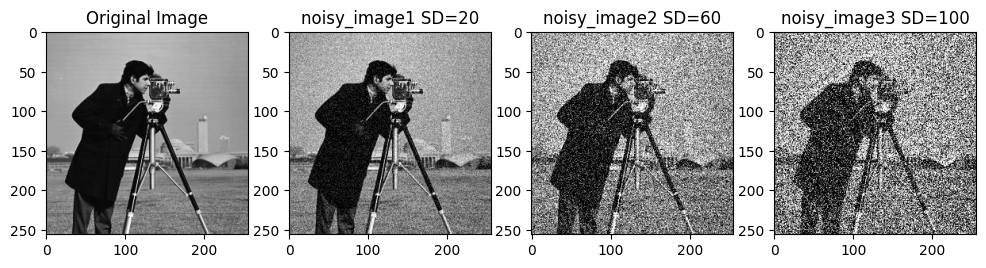

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load an image
image = cv2.imread('./images/cameraman.jpg',cv2.IMREAD_GRAYSCALE)
#print(image.shape)
# Get image shape
rows, cols = image.shape

# Set mean and standard deviation for Gaussian noise
mean = 0
std_dev1 = 20  # You can adjust this value based on the desired amount of noise
std_dev2 = 60
std_dev3 = 100

# Generate Gaussian noise
noise1 = np.random.normal(mean, std_dev1, (rows, cols))
noise2 = np.random.normal(mean, std_dev2, (rows, cols))
noise3 = np.random.normal(mean, std_dev3, (rows, cols))

# Add the noise to the image
noisy_image1 = image + noise1
noisy_image2 = image + noise2
noisy_image3 = image + noise3

# Clip the values to the valid range [0, 255]
noisy_image1 = np.clip(noisy_image1, 0, 255)
noisy_image2 = np.clip(noisy_image2, 0, 255)
noisy_image3 = np.clip(noisy_image3, 0, 255)

# Convert to uint8 type
noisy_image1 = noisy_image1.astype(np.uint8)
noisy_image2 = noisy_image2.astype(np.uint8)
noisy_image3 = noisy_image3.astype(np.uint8)

#print(noisy_image1.shape)
#Plot
plt.figure(figsize=(12, 4))

plt.subplot(1, 4, 1)
plt.imshow(image,cmap='gray')
plt.title('Original Image')

plt.subplot(1, 4, 2)
plt.imshow(noisy_image1, cmap='gray')
plt.title('noisy_image1 SD=20')

plt.subplot(1, 4, 3)
plt.imshow(noisy_image2, cmap='gray')
plt.title('noisy_image2 SD=60')

plt.subplot(1, 4, 4)
plt.imshow(noisy_image3, cmap='gray')
plt.title('noisy_image3 SD=100')

plt.show()

##Blurring with Gaussian kernel

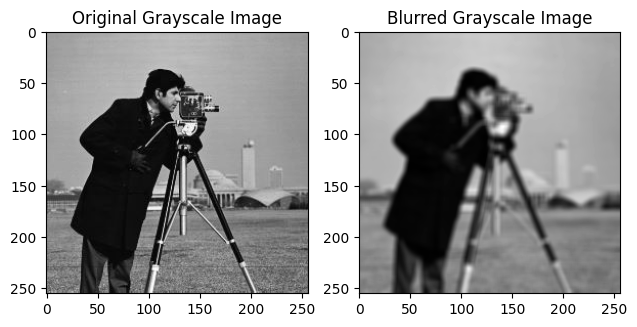

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load a grayscale image
gray_image = cv2.imread('./images/cameraman.jpg', cv2.IMREAD_GRAYSCALE)

# Create a 1D Gaussian kernel
kernel_size = 7
sigma = 3
gaussian_kernel = cv2.getGaussianKernel(kernel_size, sigma)

# Create a 2D Gaussian kernel by taking the outer product of the 1D kernel with itself
gaussian_kernel_2d = np.outer(gaussian_kernel, gaussian_kernel.T)

# Normalize the kernel to ensure the sum of its elements is 1
gaussian_kernel_2d /= gaussian_kernel_2d.sum()

# Perform convolution using the created Gaussian kernel
blurred_image = cv2.filter2D(gray_image, -1, gaussian_kernel_2d)

# Display the original and blurred images
plt.subplot(1, 2, 1)
plt.imshow(gray_image, cmap='gray')
plt.title('Original Grayscale Image')

plt.subplot(1, 2, 2)
plt.imshow(blurred_image, cmap='gray')
plt.title('Blurred Grayscale Image')

plt.tight_layout()
plt.show()


#Estimating SD of noise for homogenous image

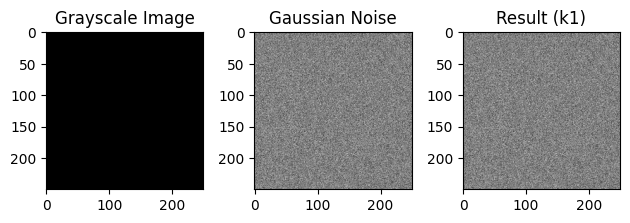

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Create a 250x250 grayscale image
image_size = (250, 250)
gray_image = np.ones(image_size, dtype=np.uint8)*50

# Create a 250x250 matrix of Gaussian noise
mean = 0
std_dev = 20
gaussian_noise = np.random.normal(mean, std_dev, image_size)

# Add the grayscale image and Gaussian noise
k1 = gray_image + gaussian_noise

# Display the images
plt.subplot(1, 3, 1)
plt.imshow(gray_image, cmap='gray')
plt.title('Grayscale Image')

plt.subplot(1, 3, 2)
plt.imshow(gaussian_noise, cmap='gray')
plt.title('Gaussian Noise')

plt.subplot(1, 3, 3)
plt.imshow(k1, cmap='gray')
plt.title('Result (k1)')

plt.tight_layout()
plt.show()


In [ ]:
k=gray_image
n=gaussian_noise
mean_k=np.mean(k)
std_k=np.std(k)
mean_n=np.mean(n)
std_n=np.std(n)
mean_k1=np.mean(k1)
std_k1=np.std(k1)

print(f"K => mean={mean_k} std={std_k}")
print(f"N => mean={mean_n} std={std_n}")
print(f"K1 => mean={mean_k1} std={std_k1}")

K => mean=50.0 std=0.0
N => mean=-0.04594340371235314 std=20.034851847423354
K1 => mean=49.954056596287636 std=20.034851847423358


##Estimating noise in NonHomogenous image

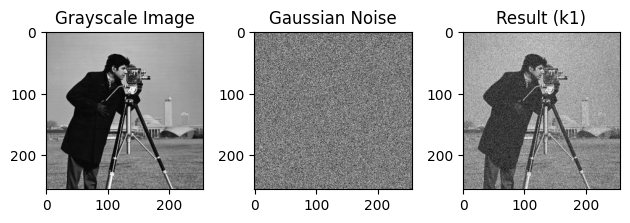

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Create a 250x250 grayscale image
image=cv2.imread('./images/cameraman.jpg',cv2.IMREAD_GRAYSCALE)

# Create a 250x250 matrix of Gaussian noise
mean = 0
std_dev = 20
image_size=image.shape
gaussian_noise = np.random.normal(mean, std_dev, image_size)

# Add the grayscale image and Gaussian noise
k1 = image + gaussian_noise

# Display the images
plt.subplot(1, 3, 1)
plt.imshow(image, cmap='gray')
plt.title('Grayscale Image')

plt.subplot(1, 3, 2)
plt.imshow(gaussian_noise, cmap='gray')
plt.title('Gaussian Noise')

plt.subplot(1, 3, 3)
plt.imshow(k1, cmap='gray')
plt.title('Result (k1)')

plt.tight_layout()
plt.show()

In [ ]:
k=image
n=gaussian_noise
mean_k=np.mean(k)
std_k=np.std(k)
mean_n=np.mean(n)
std_n=np.std(n)
mean_k1=np.mean(k1)
std_k1=np.std(k1)

print(f"K => mean={mean_k} std={std_k}")
print(f"N => mean={mean_n} std={std_n}")
print(f"K1 => mean={mean_k1} std={std_k1}")

K => mean=118.72439575195312 std=62.298167766743994
N => mean=0.02414925630372737 std=20.008143101379982
K1 => mean=118.74854500825684 std=65.39395526040236


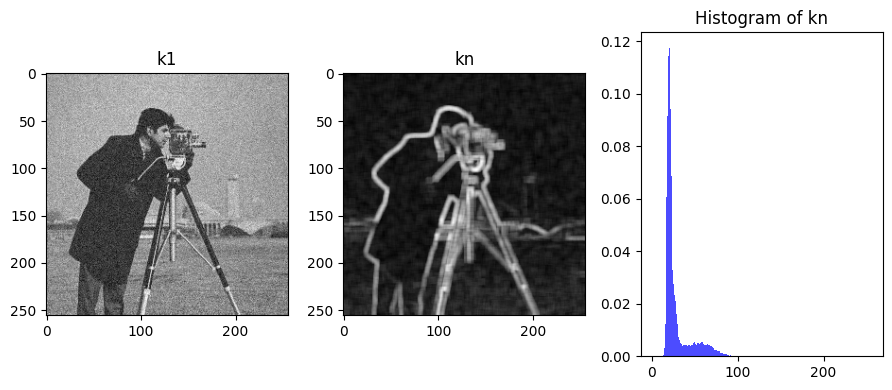

ModeResult(mode=20.0, count=7851)


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import generic_filter
from scipy.stats import mode

# Define a 7x7 kernel for standard deviation
kernel_size = 7

# Convolve the kernel over the image k1 to get kn
def std_of_neighborhood(neighborhood):
    return np.std(neighborhood)

kn = generic_filter(k1, std_of_neighborhood, size=(kernel_size, kernel_size))


# Display k1, kn, and histogram of kn
plt.figure(figsize=(12, 4))

plt.subplot(1, 4, 1)
plt.imshow(k1, cmap='gray')
plt.title('k1')

plt.subplot(1, 4, 2)
plt.imshow(kn, cmap='gray')
plt.title('kn')

plt.subplot(1, 4, 3)
plt.hist(kn.flatten(), bins=256, range=[0,256], density=True, color='blue', alpha=0.7)
plt.title('Histogram of kn')

plt.tight_layout()
plt.show()

print(mode(np.round(kn.flatten())))

#Denoising techniques

##1. Simple Averaging

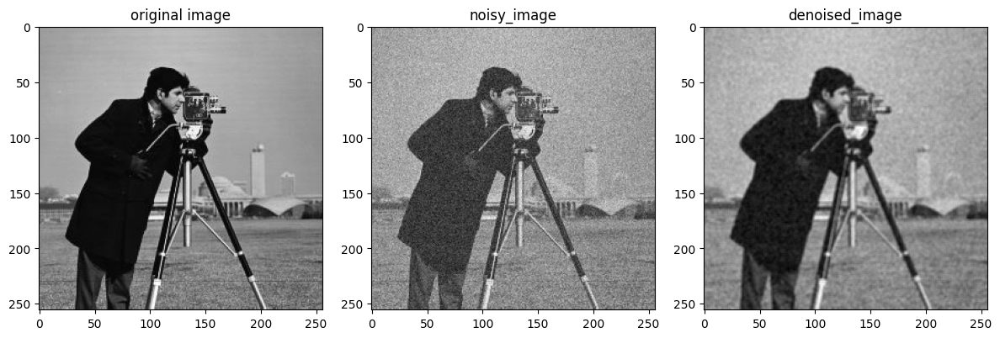

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

image=cv2.imread('./images/cameraman.jpg',cv2.IMREAD_GRAYSCALE)
mean = 0
std_dev = 20
gaussian_noise = np.random.normal(mean, std_dev, image.shape)

# Add the grayscale image and Gaussian noise
noisy_image = image + gaussian_noise

kernel = np.ones((3, 3), dtype=np.float32) / 9
denoised_image = cv2.filter2D(noisy_image, -1, kernel)

# kernel_size = 9
# sigma = 3
# gaussian_kernel = cv2.getGaussianKernel(kernel_size, sigma)

# # Create a 2D Gaussian kernel by taking the outer product of the 1D kernel with itself
# gaussian_kernel_2d = np.outer(gaussian_kernel, gaussian_kernel.T)

# # Normalize the kernel to ensure the sum of its elements is 1
# gaussian_kernel_2d /= gaussian_kernel_2d.sum()

# # Perform convolution using the created Gaussian kernel
# blurred_image = cv2.filter2D(image, -1, gaussian_kernel_2d)

plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.imshow(image, cmap='gray')
plt.title('original image')

plt.subplot(1, 3, 2)
plt.imshow(noisy_image, cmap='gray')
plt.title('noisy_image')

plt.subplot(1, 3, 3)
plt.imshow(denoised_image, cmap='gray')
plt.title('denoised_image')

plt.tight_layout()
plt.show()


In [ ]:
from scipy.ndimage import generic_filter
from scipy.stats import mode

def std_of_neighborhood(neighborhood):
    return np.std(neighborhood)

kn1 = generic_filter(noisy_image, std_of_neighborhood, size=(5, 5))
mode1=mode(np.round(kn1.flatten()))
print(mode1)

kn2 = generic_filter(denoised_image, std_of_neighborhood, size=(5, 5))
mode2=mode(np.round(kn2.flatten()))
print(mode2)

ModeResult(mode=20.0, count=6238)
ModeResult(mode=6.0, count=11013)


In [ ]:
image = image.astype(np.float64)
noisy_image = noisy_image.astype(np.float64)
denoised_image = denoised_image.astype(np.float64)

psnr1 = cv2.PSNR(image, noisy_image)
print(psnr1)

psnr2 = cv2.PSNR(image, denoised_image)
print(psnr2)

22.12427580525941
24.930139655949812


0.33464183607758247


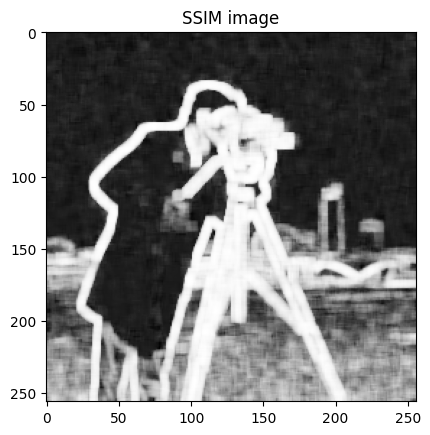

In [ ]:
from skimage.metrics import structural_similarity as ssim

ssim_index, ssim_image = ssim(image, noisy_image, full=True)
print(ssim_index)

plt.imshow(ssim_image, cmap='gray')
plt.title('SSIM image')
plt.show()

0.35901071336560814


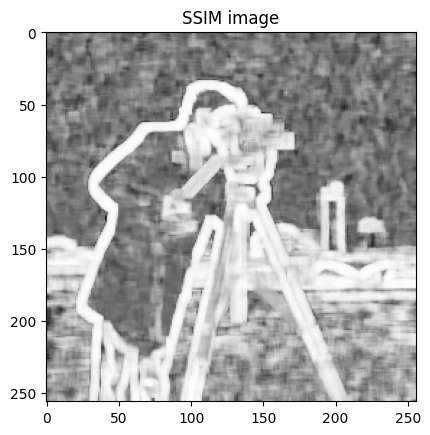

In [ ]:
from skimage.metrics import structural_similarity as ssim

ssim_index, ssim_image = ssim(image, denoised_image, full=True)
print(ssim_index)

plt.imshow(ssim_image, cmap='gray')
plt.title('SSIM image')
plt.show()

##2. Averaging multiple noisy images

TypeError: Invalid shape (1024, 256, 256) for image data

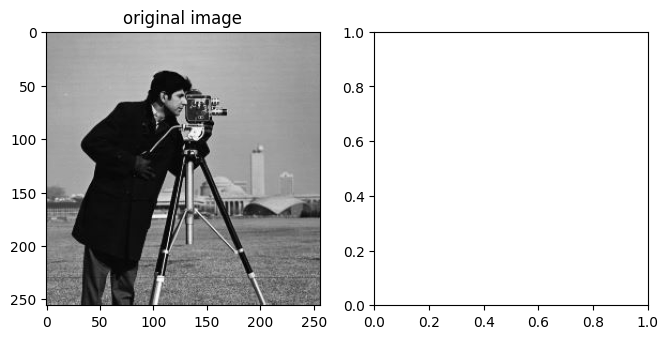

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

image=cv2.imread('./images/cameraman.jpg',cv2.IMREAD_GRAYSCALE)
mean = 0
std_dev = 20

gaussian_noise = []
noisy_image = []
n=256
denoised_image = 0
for i in range(n):
  noise = np.random.normal(mean, std_dev, image.shape)
  noisy = image + noise
  gaussian_noise.append(noise)
  noisy_image.append(noisy)

for i in range(n):
  denoised_image+=noisy_image[i]

denoised_image/=n
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.imshow(image, cmap='gray')
plt.title('original image')

plt.subplot(1, 3, 2)
plt.imshow(noisy_image1, cmap='gray')
plt.title('noisy_image')

plt.subplot(1, 3, 3)
plt.imshow(denoised_image, cmap='gray')
plt.title('denoised_image')

plt.tight_layout()
plt.show()


In [ ]:
from scipy.ndimage import generic_filter
from scipy.stats import mode

def std_of_neighborhood(neighborhood):
    return np.std(neighborhood)

kn1 = generic_filter(noisy_image1, std_of_neighborhood, size=(5, 5))
mode1=mode(np.round(kn1.flatten()))
print(mode1)

kn2 = generic_filter(denoised_image, std_of_neighborhood, size=(5, 5))
mode2=mode(np.round(kn2.flatten()))
print(mode2)

ModeResult(mode=20.0, count=6320)
ModeResult(mode=1.0, count=17623)


In [ ]:
image = image.astype(np.float64)
noisy_image1 = noisy_image1.astype(np.float64)
denoised_image = denoised_image.astype(np.float64)

psnr1 = cv2.PSNR(image, noisy_image1)
print(psnr1)

psnr2 = cv2.PSNR(image, denoised_image)
print(psnr2)

22.097286592374516
52.082527044322404


0.3328064170159547


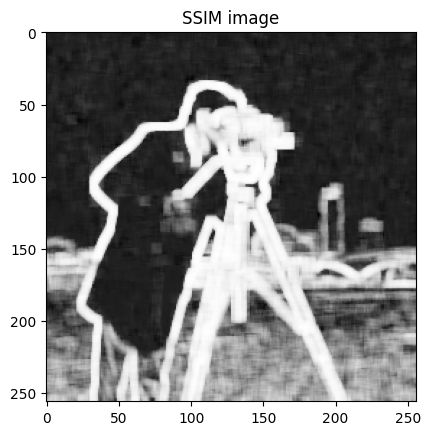

In [ ]:
from skimage.metrics import structural_similarity as ssim

ssim_index, ssim_image = ssim(image, noisy_image1, full=True)
print(ssim_index)

plt.imshow(ssim_image, cmap='gray')
plt.title('SSIM image')
plt.show()

0.9510985553150447


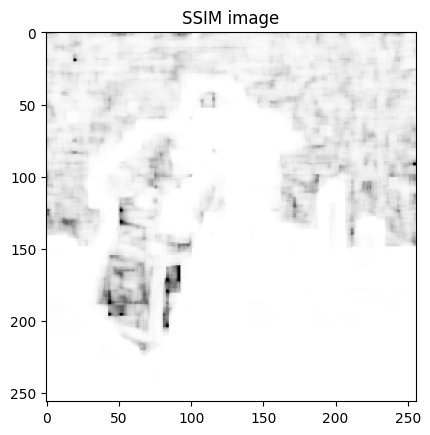

In [ ]:
from skimage.metrics import structural_similarity as ssim

ssim_index, ssim_image = ssim(image, denoised_image, full=True)
print(ssim_index)

plt.imshow(ssim_image, cmap='gray')
plt.title('SSIM image')
plt.show()